# Segmentação de Madeira

**Import das bibliotecas**

In [75]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

**Source image**: leitura da imagem original

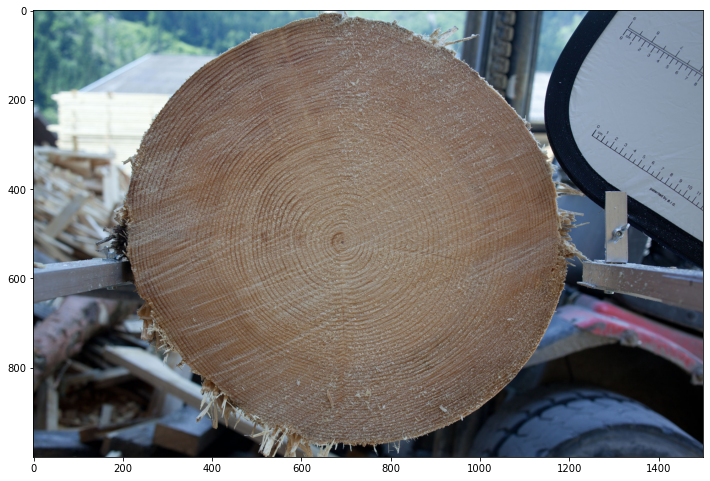

In [76]:
img_name = '5.png'
img = cv2.imread("images/"+img_name, cv2.IMREAD_COLOR)
img_copy = cv2.imread("images/"+img_name, cv2.IMREAD_COLOR)
rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
hsv = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)

plt.figure(figsize = (12,10))
plt.imshow(rgb)

In [77]:
hsv[600][600]

array([ 20,  49, 135], dtype=uint8)

**Limiarização no espaço de cor HSV**: limiarização de distâncias no espaço HSV. Perceba que os valores da segmentação são escolhidos de acordo com a cor da madeira. Nesse sentido, basta que o usuário implemente um valor de tolerância se necessário.

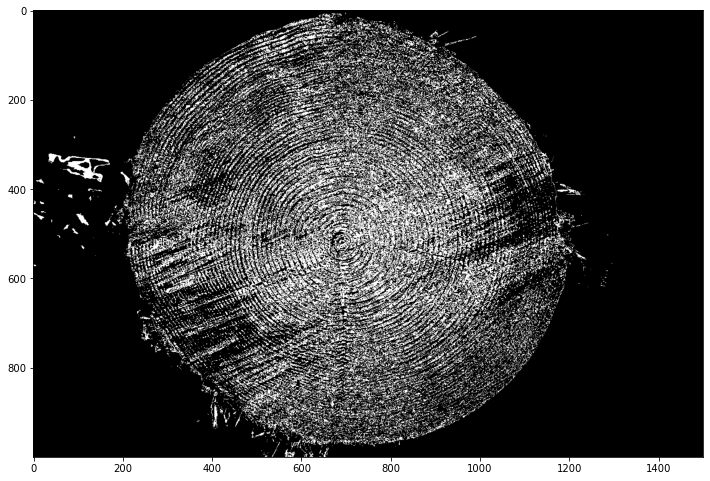

In [78]:
# tolerância para o valor de H
tol_h = 10
h = 20 # 46
s = 49 #72
v = 135 #210
h_low = h - tol_h
h_high = h + tol_h
# tolerância para o valor de S
tol_s = 20
s_low = s - tol_s
s_high = s + tol_s
# tolerância para o valor de V
tol_v = 30
v_low = v - tol_v
v_high = v + tol_v
mask1 = cv2.inRange(hsv, (h_low, s_low, v_low), (h_high, s_high, v_high))
plt.figure(figsize = (12,10))
plt.imshow(mask1,'gray')

**Fechamento**: operação de fechamento realizada sobre o resultado da limiarização no espaço de cor HSV. Fecha a maioria dos buracos encontrados, transformando a face da madeira em um componente conexo.

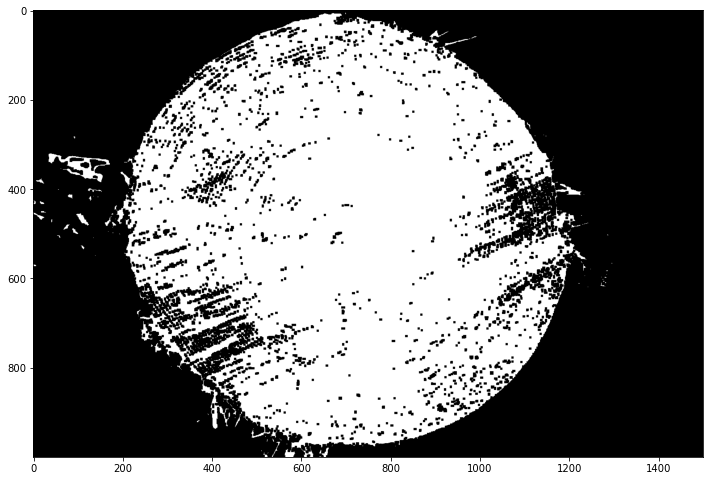

In [79]:
kernel = np.ones((5,5),np.uint8)
mask2 = cv2.morphologyEx(mask1, cv2.MORPH_CLOSE, kernel)
plt.figure(figsize = (12,10))
plt.imshow(mask2,'gray')

**Abertura**: operação de abertura realizada no resultado da operação de fechamento. Perceba que as duas operações em sequência (abertura e fechamento) servem para desconectar elemenos indesejados da madeira principal.

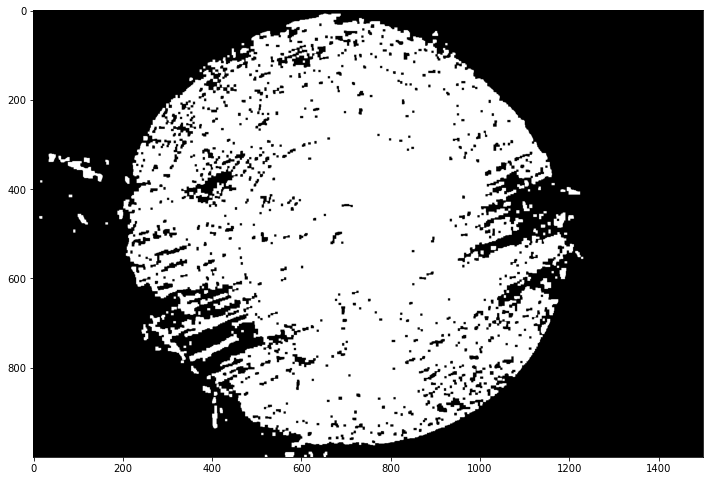

In [80]:
mask3 = cv2.morphologyEx(mask2, cv2.MORPH_OPEN, kernel)
plt.figure(figsize = (12,10))
plt.imshow(mask3,'gray')

**Convex hull**: todos os componentes conexos do resultado da abertura são analisados e aquele com maior área é selecionado. Nesse componente é realizada a operação de envoltório convexo (convex hull) a fim de suavizar as bordas. Note que o elemento resultante dessa operação pode ser visto na imagem seguinte em um tom de cinza.

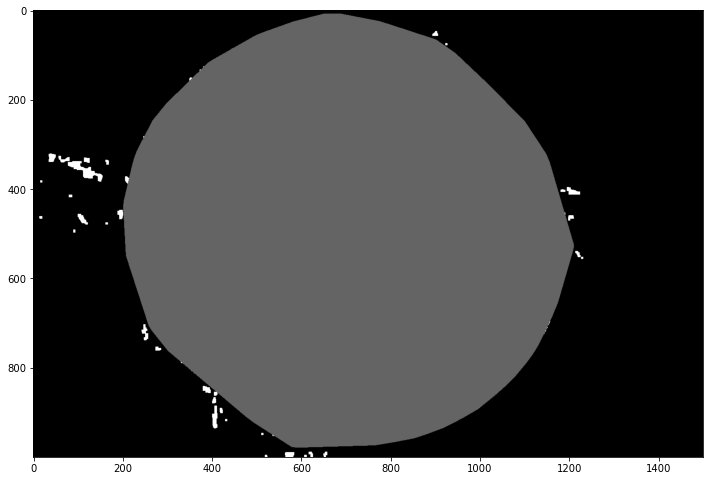

In [81]:
contours,hierarchy = cv2.findContours(mask3, cv2.CHAIN_APPROX_NONE, 2)
try:
    cnt = contours[0]
except:
    print("Nenhum objeto detectado na imagem!")
maior_area = 0
maior_area_indice = 0
for areas in range(len(contours)):
    N = cv2.contourArea(contours[areas])
    #print("Area é: " + str(N))
    if N > maior_area:
        maior_area = N
        maior_area_indice = areas
hull = cv2.convexHull(contours[maior_area_indice])
cv2.fillPoly(mask3, pts = [hull], color=(100,100,100))
plt.figure(figsize = (12,10))
plt.imshow(mask3,'gray')

**Threshold**: o elemento cinza, resultante de operação de envoltório convexo, é então limiarizado. O resultado dessa limiarização é, em geral, a segmentação da face da tora de madeira.

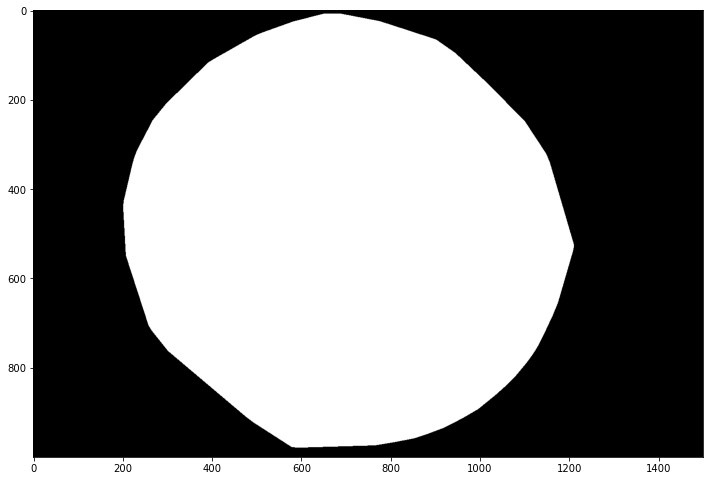

In [82]:
thresh1 = cv2.inRange(mask3,(20),(200))
plt.figure(figsize = (12,10))
plt.imshow(thresh1,'gray')

**Comparativo final**: nas figuras à seguir é possível verificar (1) a imagem original, (2) a máscara de segmentação e (3) a multiplicação de (1) e (2).

True

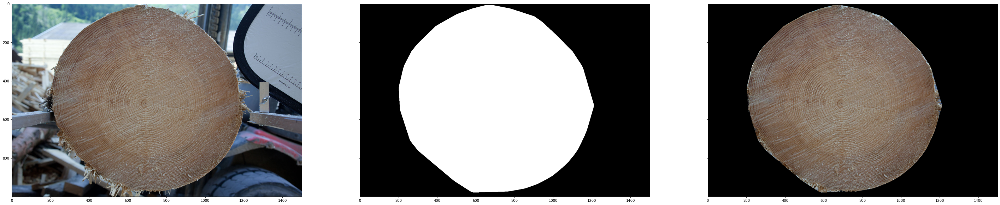

In [83]:
thresh2 = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
thresh2[:,:,0] = thresh1
thresh2[:,:,1] = thresh1
thresh2[:,:,2] = thresh1
masked = cv2.multiply(rgb, (thresh2//255))
fig, axes = plt.subplots(1, 3, figsize=(50, 40), sharex=True, sharey=True)
ax = axes.ravel()
ax[0].imshow(rgb)
ax[1].imshow(thresh1, 'gray')
ax[2].imshow(masked, 'gray')
cv2.imwrite('mask.png',cv2.cvtColor(masked, cv2.COLOR_RGB2BGR))

# Contagem de Anéis (bônus)

**Contagem de anéis**: desse ponto em diante é criada uma pipeline com o objetivo de tentar estimar a quantidade de anéis presentes na face da madeira.

**Aumento de contraste**: inicialmente é necessário aumentar o contraste para destacar mais ainda os anéis. Perceba nas figuras abaixo que (1) tem anéis bastante destacados em comparação com (2).

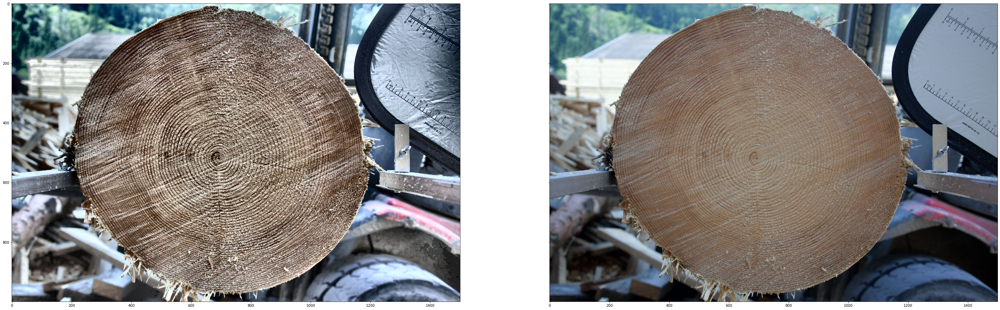

In [84]:
kernel_side = 1
kernel2 = np.ones((kernel_side,kernel_side),np.float32)/kernel_side**2
dst = cv2.filter2D(img,-1,kernel2)
lab = cv2.cvtColor(dst, cv2.COLOR_BGR2LAB)
l, a, b = cv2.split(lab)
clahe = cv2.createCLAHE(clipLimit=100, tileGridSize=(8,8))
cl = clahe.apply(l)
limg = cv2.merge((cl,a,b))
final = cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)
final_bgr = cv2.cvtColor(final,cv2.COLOR_RGB2BGR)

fig, axes = plt.subplots(1, 2, figsize=(50, 40), sharex=True, sharey=True)
ax = axes.ravel()
ax[0].imshow(final)
ax[1].imshow(rgb)


**Conversão para a escala de cinza**: conversão das imagens (original e com alto contraste) para a escala de cor cinza.

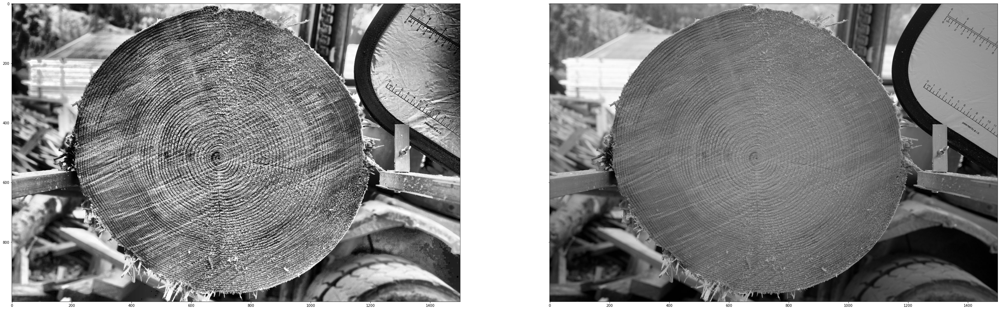

In [85]:
gray = cv2.cvtColor(final, cv2.COLOR_RGB2GRAY)
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#plt.figure(figsize = (12,10))
#plt.imshow(thr,'gray')
fig, axes = plt.subplots(1, 2, figsize=(50, 40), sharex=True, sharey=True)
ax = axes.ravel()
ax[0].imshow(gray,'gray')
ax[1].imshow(gray_img,'gray')

**Threshold**: aplica-se então uma limiarização simples e, então, multiplica-se o resultado pela máscara de segmentação obtida na operação de segmentação anterior.

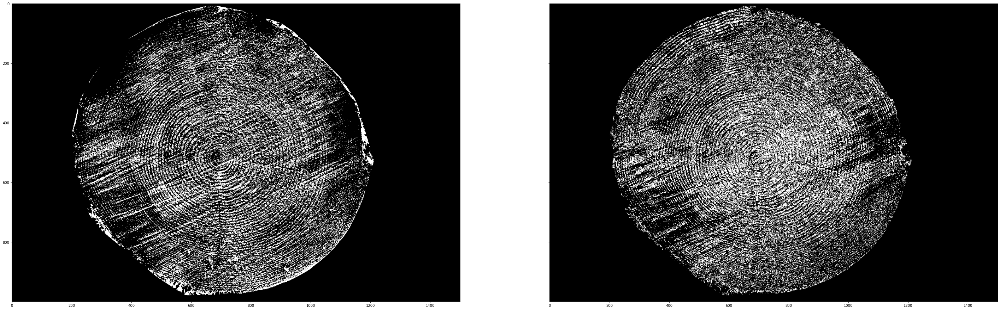

In [86]:
ret,thr = cv2.threshold(gray,160,255,cv2.THRESH_BINARY)
masked_thr = cv2.multiply(thr, (thresh1//255))
mask1_selected = cv2.multiply(mask1, (thresh1//255))

fig, axes = plt.subplots(1, 2, figsize=(50, 40), sharex=True, sharey=True)
ax = axes.ravel()
ax[0].imshow(masked_thr,'gray')
ax[1].imshow(mask1_selected,'gray')

**Centróide**: cálculo do centro geométrico da máscara de segmentação. Em geral esse centróide está muito próximo do centro da face da madeira.

In [87]:
M = cv2.moments(thresh1.copy())
cx = int(M["m10"] / M["m00"])
cy = int(M["m01"] / M["m00"])
img_center = thresh1.copy()

**Contagem de anéis**: por fim, vários vetores são traçados partindo de uma região próxima do centróide calculado até a borda da madeira. É importante que diversos vetores sejam traçados justamente para diminuir a influência de ruídos. Na imagem abaixo é possível verificar todos os vetores traçados para contar os anéis.

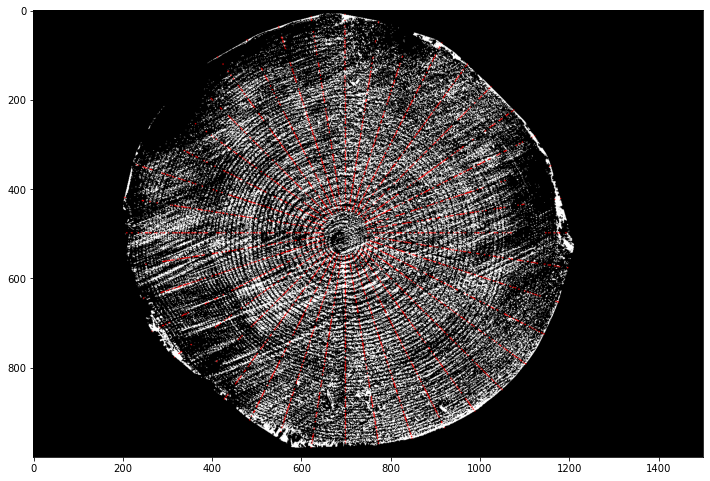

In [88]:
import math

img_drawn = rgb.copy()
img_drawn[:,:,0] = masked_thr.copy()
img_drawn[:,:,1] = masked_thr.copy()
img_drawn[:,:,2] = masked_thr.copy()
rings_list = []

vector_amount = 40

for i in range(0, 360, int(360/vector_amount)):
    ncx = cx
    ncy = cy
    r = 50
    act_sign = masked_thr[ncy][ncx]
    rings = 0
    while img_center[ncy][ncx] > 0:
        ncx = int(cx + r*math.cos(math.radians(i)))
        ncy = int(cy + r*math.sin(math.radians(i)))
        if masked_thr[ncy][ncx] != act_sign:
            act_sign = masked_thr[ncy][ncx]
            rings += 1
            trash = cv2.circle(img_drawn, (ncx, ncy), 1, (255,0,0), -1)
        r += 1
    rings_list.append(rings)

plt.figure(figsize = (12,10))
plt.imshow(img_drawn,'gray')

**Anéis**: quantidade de anéis encontrados.

In [89]:
print("Contagem de aneis: ")
print(max(rings_list)/2)

Contagem de aneis: 
74.5
